In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import model_selection
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

In [2]:
#reading csv files
bayarea = pd.read_csv(r"C:\Users\Brian Lin\Desktop\UCI\python\group final project\webscrapping_data\Bay_area.csv")
boston = pd.read_csv(r"C:\Users\Brian Lin\Desktop\UCI\python\group final project\webscrapping_data\Boston.csv")
seatle = pd.read_csv(r"C:\Users\Brian Lin\Desktop\UCI\python\group final project\webscrapping_data\Seatle.csv")
#newyork  =  pd.read_csv(r"C:\Users\Brian Lin\Desktop\UCI\python\group final project\webscrapping_data\New_york.csv")

In [3]:
bayarea['place'] = 'bayarea'
boston['place'] = 'boston'
seatle['place'] = 'seatle'
#newyork['place'] = 'newyork'

In [4]:
bayarea.reset_index(inplace=True)
boston.reset_index(inplace=True)
seatle.reset_index(inplace=True)
#newyork.reset_index(inplace=True)

In [5]:
print(seatle.shape)
print(bayarea.shape)
print(boston.shape)
#print(newyork.shape)

(1500, 86)
(1347, 86)
(1498, 86)


In [6]:
#newdata = pd.concat([seatle,boston,bayarea,newyork])
newdata = pd.concat([seatle,boston,bayarea])

In [7]:
newdata.shape

(4345, 86)

In [8]:
for col in newdata.columns:
    print(col)
#newdata.columns.groupby(type(col))

index
id
listing_url
name
summary
space
description
neighborhood_overview
notes
transit
thumbnail_url
host_id
host_url
host_name
host_since
host_location
host_about
host_response_time
host_response_rate
host_acceptance_rate
host_is_superhost
host_thumbnail_url
host_picture_url
host_neighbourhood
host_listings_count
host_total_listings_count
host_verifications
host_has_profile_pic
host_identity_verified
street
neighbourhood
neighbourhood_cleansed
neighbourhood_group_cleansed
city
state
zipcode
market
smart_location
country_code
country
latitude
longitude
is_location_exact
property_type
room_type
accommodates
bathrooms
bedrooms
beds
bed_type
amenities
square_feet
price
weekly_price
monthly_price
security_deposit
cleaning_fee
guests_included
extra_people
minimum_nights
maximum_nights
calendar_updated
has_availability
availability_30
availability_60
availability_90
availability_365
number_of_reviews
review_scores_rating
review_scores_accuracy
review_scores_cleanliness
review_scores_checkin

In [9]:
newdata[['review_scores_rating','review_scores_accuracy',
         'review_scores_accuracy','review_scores_cleanliness'
         ,'review_scores_checkin','review_scores_communication'
         ,'review_scores_location','review_scores_value']].describe()

,review_scores_rating,review_scores_accuracy,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
count,3654.000000,3646.000000,3646.000000,3652.000000,3649.000000,3651.000000,3647.000000,3646.000000
mean,94.188287,9.622052,9.622052,9.488499,9.766237,9.779786,9.653140,9.401810
std,7.126069,0.730895,0.730895,0.855247,0.594566,0.564461,0.663735,0.794071
min,20.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000
25%,92.000000,9.000000,9.000000,9.000000,10.000000,10.000000,9.000000,9.000000
50%,96.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000
75%,99.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000
max,100.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000


In [10]:
newdata[['property_type','review_scores_rating','review_scores_accuracy',
         'review_scores_accuracy','review_scores_cleanliness'
         ,'review_scores_checkin','review_scores_communication'
         ,'review_scores_location','review_scores_value','ranking']
       ].groupby('property_type').describe()

review_scores_rating                                        \
                                  count        mean        std    min     25%   
property_type                                                                   
Apartment                        1657.0   92.728425   8.297233   20.0   90.00   
Bed & Breakfast                    20.0   94.000000   9.569689   58.0   93.75   
Bed and breakfast                   5.0   98.000000   1.414214   96.0   98.00   
Boat                                8.0   93.875000   3.796145   90.0   90.00   
Bungalow                           24.0   97.166667   2.296816   92.0   95.75   
Cabin                               9.0   94.555556   5.479761   84.0   96.00   
Camper/RV                           8.0   89.500000  12.270755   60.0   90.25   
Condominium                       165.0   95.545455   5.294330   74.0   93.00   
Cottage                             8.0   97.875000   1.552648   95.0   97.00   
Dorm                                3.0   87.666667   5.033223   83.0   85.00   
Entire Floor                        0.0         NaN        NaN    NaN     NaN   
Guest suite                        61.0   96.770492   3.787671   77.0   96.00   
Guesthouse                         74.0   96.716216   3.706789   80.0   97.00   
House                            1409.0   95.137686   5.989295   20.0   93.00   
Loft                               44.0   96.295455   3.554097   87.0   94.00   
Other                              10.0   95.400000   3.438346   90.0   93.25   
Serviced apartment                  4.0   95.750000   3.862210   90.0   95.25   
Tiny house                          1.0   98.000000        NaN   98.0   98.00   
Townhouse                         125.0   96.488000   4.514521   70.0   95.00   
Treehouse                           1.0  100.000000        NaN  100.0  100.00   
Villa                              17.0   97.352941   2.572479   90.0   96.00   

                                         review_scores_accuracy             \
                      50%     75%    max                  count       mean   
property_type                                                                
Apartment            95.0   98.00  100.0                 1656.0   9.495169   
Bed & Breakfast      97.0  100.00  100.0                   20.0   9.300000   
Bed and breakfast    98.0   98.00  100.0                    5.0   9.800000   
Boat                 94.0   95.75  100.0                    7.0   9.571429   
Bungalow             98.0   99.00  100.0                   24.0   9.916667   
Cabin                97.0   98.00   98.0                    9.0   9.777778   
Camper/RV            94.5   95.25   97.0                    8.0   9.500000   
Condominium          97.0  100.00  100.0                  164.0   9.798780   
Cottage              98.0   99.00  100.0                    8.0  10.000000   
Dorm                 87.0   90.00   93.0                    3.0   8.666667   
Entire Floor          NaN     NaN    NaN                    0.0        NaN   
Guest suite          98.0   99.00  100.0                   61.0   9.852459   
Guesthouse           98.0   99.00  100.0                   74.0   9.864865   
House                97.0   99.00  100.0                 1406.0   9.702703   
Loft                 97.0   99.25  100.0                   43.0   9.697674   
Other                94.5   98.00  100.0                   10.0   9.600000   
Serviced apartment   97.5   98.00   98.0                    4.0   9.750000   
Tiny house           98.0   98.00   98.0                    1.0  10.000000   
Townhouse            98.0  100.00  100.0                  124.0   9.830645   
Treehouse           100.0  100.00  100.0                    1.0  10.000000   
Villa                97.0   99.00  100.0                   17.0   9.882353   

                    ... review_scores_value       ranking               \
                    ...                 75%   max   count         mean   
property_type       ...                              

In [11]:
newdata[['room_type','review_scores_rating','review_scores_accuracy',
         'review_scores_accuracy','review_scores_cleanliness'
         ,'review_scores_checkin','review_scores_communication'
         ,'review_scores_location','review_scores_value','ranking']].groupby('room_type').describe()

review_scores_rating                                         \
                               count       mean       std   min   25%   50%   
room_type                                                                     
Entire home/apt               2211.0  93.981456  7.331462  20.0  92.0  96.0   
Private room                  1314.0  94.515221  6.851165  20.0  93.0  96.0   
Shared room                    129.0  94.403101  6.151117  60.0  93.0  96.0   

                             review_scores_accuracy            ...  \
                  75%    max                  count      mean  ...   
room_type                                                      ...   
Entire home/apt  99.0  100.0                 2208.0  9.604620  ...   
Private room     99.0  100.0                 1309.0  9.669213  ...   
Shared room      98.0  100.0                  129.0  9.441860  ...   

                review_scores_value       ranking                          \
                                75%   max   count        mean         std   
room_type                                                                   
Entire home/apt                10.0  10.0  2632.0  788.313830  425.094441   
Private room                   10.0  10.0  1555.0  636.520257  397.888356   
Shared room                    10.0  10.0   158.0  581.132911  383.369375   

                                                       
                  min     25%    50%      75%     max  
room_type                                              
Entire home/apt   1.0  429.75  803.5  1160.00  1500.0  
Private room      1.0  300.00  626.0   951.50  1498.0  
Shared room      53.0  262.25  523.0   801.25  1497.0  

[3 rows x 72 columns]

In [12]:
newdata[['host_is_superhost','review_scores_rating',
         'review_scores_accuracy','review_scores_accuracy',
         'review_scores_cleanliness','review_scores_checkin',
         'review_scores_communication','review_scores_location',
         'review_scores_value','ranking']].groupby('host_is_superhost').describe()

review_scores_rating                                         \
                                 count       mean       std   min   25%   50%   
host_is_superhost                                                               
f                               2525.0  92.815446  7.970627  20.0  90.0  95.0   
t                               1128.0  97.256206  2.939943  60.0  96.0  98.0   

                               review_scores_accuracy            ...  \
                    75%    max                  count      mean  ...   
host_is_superhost                                                ...   
f                  99.0  100.0                 2518.0  9.490866  ...   
t                  99.0  100.0                 1127.0  9.914818  ...   

                  review_scores_value       ranking                          \
                                  75%   max   count        mean         std   
host_is_superhost                                                             
f                                10.0  10.0  3185.0  753.853061  423.286293   
t                                10.0  10.0  1157.0  649.958513  405.484306   

                                                      
                   min    25%    50%     75%     max  
host_is_superhost                                     
f                  1.0  402.0  757.0  1123.0  1500.0  
t                  1.0  292.0  631.0   989.0  1497.0  

[2 rows x 72 columns]

In [13]:
newdata['host_is_superhost'] = newdata.host_is_superhost.replace('f',0).replace('t',1)

In [14]:
shorteneddata = newdata[['id','place','host_is_superhost','price',
                         'number_of_reviews','review_scores_rating',
                         'review_scores_accuracy','review_scores_cleanliness',
                         'review_scores_checkin','review_scores_communication',
                         'review_scores_location','review_scores_value',
                         'reviews_per_month','ranking']]

In [15]:
shorteneddata.isnull().sum()

id                               0
place                            0
host_is_superhost                3
price                            0
number_of_reviews                0
review_scores_rating           691
review_scores_accuracy         699
review_scores_cleanliness      693
review_scores_checkin          696
review_scores_communication    694
review_scores_location         698
review_scores_value            699
reviews_per_month              658
ranking                          0
dtype: int64

In [16]:
shorteneddata.review_scores_rating=shorteneddata.review_scores_rating.fillna(value = shorteneddata.review_scores_rating.mean())
shorteneddata.review_scores_accuracy=shorteneddata.review_scores_accuracy.fillna(value = shorteneddata.review_scores_accuracy.mean())
shorteneddata.review_scores_cleanliness=shorteneddata.review_scores_cleanliness.fillna(value = shorteneddata.review_scores_cleanliness.mean())
shorteneddata.review_scores_checkin=shorteneddata.review_scores_checkin.fillna(value = shorteneddata.review_scores_checkin.mean())
shorteneddata.review_scores_communication=shorteneddata.review_scores_communication.fillna(value = shorteneddata.review_scores_communication.mean())
shorteneddata.review_scores_location=shorteneddata.review_scores_location.fillna(value = shorteneddata.review_scores_location.mean())
shorteneddata.review_scores_value=shorteneddata.review_scores_value.fillna(value = shorteneddata.review_scores_value.mean())
shorteneddata.reviews_per_month=shorteneddata.reviews_per_month.fillna(value = shorteneddata.reviews_per_month.mean())
shorteneddata.host_is_superhost=shorteneddata.host_is_superhost.fillna(value = 0)

shorteneddata['price'] = shorteneddata['price'].str.replace('$','').str.replace(',','').astype(float)


C:\Users\Brian Lin\AppData\Local\Temp\ipykernel_28880\744156686.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  shorteneddata.review_scores_rating=shorteneddata.review_scores_rating.fillna(value = shorteneddata.review_scores_rating.mean())
C:\Users\Brian Lin\AppData\Local\Temp\ipykernel_28880\744156686.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  shorteneddata.review_scores_accuracy=shorteneddata.review_scores_accuracy.fillna(value = shorteneddata.review_scores_accuracy.mean())
C:\Users\Brian Lin

In [17]:
shorteneddata.isnull().sum()

id                             0
place                          0
host_is_superhost              0
price                          0
number_of_reviews              0
review_scores_rating           0
review_scores_accuracy         0
review_scores_cleanliness      0
review_scores_checkin          0
review_scores_communication    0
review_scores_location         0
review_scores_value            0
reviews_per_month              0
ranking                        0
dtype: int64

In [18]:
import csv
from pathlib import Path
filepath = Path('cleaned_data.csv') 
filepath.parent.mkdir(parents=True, exist_ok=True)  
shorteneddata.to_csv(filepath)  

In [19]:
anotherdata = newdata[['host_is_superhost','price','is_location_exact',
                         'review_scores_rating','review_scores_accuracy',
                       'review_scores_cleanliness','review_scores_checkin',
                       'review_scores_communication','review_scores_location',
                       'review_scores_value','reviews_per_month','ranking']]

In [20]:

anotherdata.review_scores_rating=anotherdata.review_scores_rating.fillna(value = anotherdata.review_scores_rating.mean())
anotherdata.review_scores_accuracy=anotherdata.review_scores_accuracy.fillna(value = anotherdata.review_scores_accuracy.mean())
anotherdata.review_scores_cleanliness=anotherdata.review_scores_cleanliness.fillna(value = anotherdata.review_scores_cleanliness.mean())
anotherdata.review_scores_checkin=anotherdata.review_scores_checkin.fillna(value = anotherdata.review_scores_checkin.mean())
anotherdata.review_scores_communication=anotherdata.review_scores_communication.fillna(value = anotherdata.review_scores_communication.mean())
anotherdata.review_scores_location=anotherdata.review_scores_location.fillna(value = anotherdata.review_scores_location.mean())
anotherdata.review_scores_value=anotherdata.review_scores_value.fillna(value = anotherdata.review_scores_value.mean())
anotherdata.reviews_per_month=anotherdata.reviews_per_month.fillna(value = anotherdata.reviews_per_month.mean())
anotherdata.dropna(axis=0, how='any', inplace=True)

anotherdata['host_is_superhost']=anotherdata['host_is_superhost'].replace('t',1).replace('f',0)
anotherdata['is_location_exact']=anotherdata['is_location_exact'].replace('t',1).replace('f',0)
anotherdata['price'] = anotherdata['price'].str.replace('$','').str.replace(',','').astype(float)


C:\Users\Brian Lin\AppData\Local\Temp\ipykernel_28880\1664575000.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  anotherdata.review_scores_rating=anotherdata.review_scores_rating.fillna(value = anotherdata.review_scores_rating.mean())
C:\Users\Brian Lin\AppData\Local\Temp\ipykernel_28880\1664575000.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  anotherdata.review_scores_accuracy=anotherdata.review_scores_accuracy.fillna(value = anotherdata.review_scores_accuracy.mean())
C:\Users\Brian Lin\AppData\L

In [21]:
anotherdata['istop20%'] = [1 if i <(1500//5)  else 0 for i in anotherdata['ranking'] ]
anotherdata['istop20-40%'] = [1 if( i >(1500//5)) & (i <(2*1500//5) ) else 0 for i in anotherdata['ranking'] ]
anotherdata['istop40-60%'] = [1 if (i >(2*1500//5)) & (i <(3*1500//5)) else 0 for i in anotherdata['ranking'] ]
anotherdata['istop60-80%'] = [1 if( i >(3*1500//5)) & (i <(4*1500//5)) else 0 for i in anotherdata['ranking'] ]

C:\Users\Brian Lin\AppData\Local\Temp\ipykernel_28880\1357972764.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  anotherdata['istop20%'] = [1 if i <(1500//5)  else 0 for i in anotherdata['ranking'] ]
C:\Users\Brian Lin\AppData\Local\Temp\ipykernel_28880\1357972764.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  anotherdata['istop20-40%'] = [1 if( i >(1500//5)) & (i <(2*1500//5) ) else 0 for i in anotherdata['ranking'] ]
C:\Users\Brian Lin\AppData\Local\Temp\ipykernel_28880\1357972764.py:3: SettingWi

In [22]:
anotherdata.isnull().sum()

host_is_superhost              0
price                          0
is_location_exact              0
review_scores_rating           0
review_scores_accuracy         0
review_scores_cleanliness      0
review_scores_checkin          0
review_scores_communication    0
review_scores_location         0
review_scores_value            0
reviews_per_month              0
ranking                        0
istop20%                       0
istop20-40%                    0
istop40-60%                    0
istop60-80%                    0
dtype: int64

In [23]:
filepath = Path('cleaned_data2.csv') 
filepath.parent.mkdir(parents=True, exist_ok=True)  
anotherdata.to_csv(filepath)


In [24]:
from sklearn import metrics
#Linear regression
X = shorteneddata.drop('ranking',axis=1).drop('place',axis=1)
y= pd.Series.to_frame(shorteneddata['ranking'])
reg = LinearRegression().fit(X,y)
X_train, X_test, y_train, y_test = train_test_split(X,y)
y_pred = reg.predict(X_test)
#MSE
print(metrics.mean_squared_error(y_test,y_pred))
print(metrics.explained_variance_score(y_test,y_pred))

159563.72167293972
0.12070481036694192


In [27]:
from sklearn import tree
X = anotherdata.drop('ranking',axis=1).drop('istop20-40%',axis=1).drop('istop20%',axis=1).drop('istop40-60%',axis=1).drop('istop60-80%',axis=1)
y= (anotherdata[['ranking']])
clf00 = tree.DecisionTreeClassifier()
clf000 = clf00.fit(X_train,y_train)
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.33, random_state=42)
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text
decision_tree = DecisionTreeClassifier(random_state=0, max_depth=4)
decision_tree = decision_tree.fit(X_train, y_train)

In [28]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(decision_tree, X_test, y_test)
plt.title('Confusion Matrix')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()

C:\Users\Public\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


KeyboardInterrupt: 

[Text(0.5, 0.9, 'X[10] <= 2.935\ngini = 0.999\nsamples = 2909\nvalue = [1, 2, 3 ... 2, 2, 2]'),
 Text(0.25, 0.7, 'X[10] <= 2.695\ngini = 0.999\nsamples = 2444\nvalue = [1, 2, 3 ... 0, 2, 2]'),
 Text(0.125, 0.5, 'X[10] <= 1.985\ngini = 0.999\nsamples = 2387\nvalue = [1, 2, 3 ... 0, 2, 2]'),
 Text(0.0625, 0.3, 'X[6] <= 9.383\ngini = 0.999\nsamples = 2166\nvalue = [1, 2, 1 ... 0, 2, 2]'),
 Text(0.03125, 0.1, 'gini = 0.997\nsamples = 362\nvalue = [0, 0, 0 ... 0, 0, 1]'),
 Text(0.09375, 0.1, 'gini = 0.999\nsamples = 1804\nvalue = [1, 2, 1 ... 0, 2, 1]'),
 Text(0.1875, 0.3, 'X[10] <= 2.295\ngini = 0.995\nsamples = 221\nvalue = [0, 0, 2 ... 0, 0, 0]'),
 Text(0.15625, 0.1, 'gini = 0.989\nsamples = 105\nvalue = [0, 0, 2 ... 0, 0, 0]'),
 Text(0.21875, 0.1, 'gini = 0.991\nsamples = 116\nvalue = [0, 0, 0 ... 0, 0, 0]'),
 Text(0.375, 0.5, 'X[10] <= 2.785\ngini = 0.981\nsamples = 57\nvalue = [0, 0, 0 ... 0, 0, 0]'),
 Text(0.3125, 0.3, 'X[9] <= 9.5\ngini = 0.954\nsamples = 25\nvalue = [0, 0, 0 ... 0,

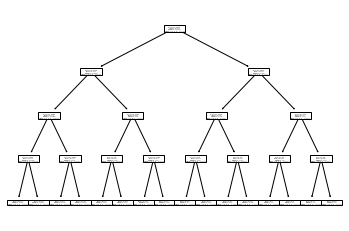

In [29]:
#decision tree for top 20%
from sklearn import tree
X = anotherdata.drop('ranking',axis=1).drop('istop20-40%',axis=1).drop('istop20%',axis=1).drop('istop40-60%',axis=1).drop('istop60-80%',axis=1)
y= (anotherdata[['istop20%']])
clf2 = tree.DecisionTreeClassifier()
clf20 = clf2.fit(X, y)
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text
decision_tree = DecisionTreeClassifier(random_state=0, max_depth=4)
decision_tree = decision_tree.fit(X_train, y_train)
tree.plot_tree(decision_tree)

In [30]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.33, random_state=42)

In [31]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text
decision_tree = DecisionTreeClassifier(random_state=0, max_depth=4)
decision_tree = decision_tree.fit(X_train, y_train)

[Text(0.5267857142857143, 0.9, 'X[1] <= 136.5\ngini = 0.327\nsamples = 2909\nvalue = [2310, 599]'),
 Text(0.2857142857142857, 0.7, 'X[7] <= 9.89\ngini = 0.374\nsamples = 1622\nvalue = [1218, 404]'),
 Text(0.14285714285714285, 0.5, 'X[1] <= 74.5\ngini = 0.256\nsamples = 418\nvalue = [355, 63]'),
 Text(0.07142857142857142, 0.3, 'X[1] <= 27.5\ngini = 0.336\nsamples = 159\nvalue = [125, 34]'),
 Text(0.03571428571428571, 0.1, 'gini = 0.5\nsamples = 8\nvalue = [4, 4]'),
 Text(0.10714285714285714, 0.1, 'gini = 0.318\nsamples = 151\nvalue = [121, 30]'),
 Text(0.21428571428571427, 0.3, 'X[10] <= 1.96\ngini = 0.199\nsamples = 259\nvalue = [230, 29]'),
 Text(0.17857142857142858, 0.1, 'gini = 0.232\nsamples = 217\nvalue = [188, 29]'),
 Text(0.25, 0.1, 'gini = 0.0\nsamples = 42\nvalue = [42, 0]'),
 Text(0.42857142857142855, 0.5, 'X[1] <= 36.5\ngini = 0.406\nsamples = 1204\nvalue = [863, 341]'),
 Text(0.35714285714285715, 0.3, 'X[2] <= 0.5\ngini = 0.5\nsamples = 47\nvalue = [23, 24]'),
 Text(0.32142

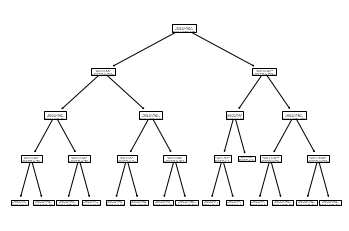

In [32]:
tree.plot_tree(decision_tree)

In [33]:
import matplotlib.pyplot as plt
plt.savefig('tree.eps',format='eps',bbox_inches = "tight")

<Figure size 432x288 with 0 Axes>

In [34]:
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (100,100), dpi=350)
tree.plot_tree(decision_tree,filled=True,rounded=True, ax=axes)

[Text(0.5267857142857143, 0.9, 'X[1] <= 136.5\ngini = 0.327\nsamples = 2909\nvalue = [2310, 599]'),
 Text(0.2857142857142857, 0.7, 'X[7] <= 9.89\ngini = 0.374\nsamples = 1622\nvalue = [1218, 404]'),
 Text(0.14285714285714285, 0.5, 'X[1] <= 74.5\ngini = 0.256\nsamples = 418\nvalue = [355, 63]'),
 Text(0.07142857142857142, 0.3, 'X[1] <= 27.5\ngini = 0.336\nsamples = 159\nvalue = [125, 34]'),
 Text(0.03571428571428571, 0.1, 'gini = 0.5\nsamples = 8\nvalue = [4, 4]'),
 Text(0.10714285714285714, 0.1, 'gini = 0.318\nsamples = 151\nvalue = [121, 30]'),
 Text(0.21428571428571427, 0.3, 'X[10] <= 1.96\ngini = 0.199\nsamples = 259\nvalue = [230, 29]'),
 Text(0.17857142857142858, 0.1, 'gini = 0.232\nsamples = 217\nvalue = [188, 29]'),
 Text(0.25, 0.1, 'gini = 0.0\nsamples = 42\nvalue = [42, 0]'),
 Text(0.42857142857142855, 0.5, 'X[1] <= 36.5\ngini = 0.406\nsamples = 1204\nvalue = [863, 341]'),
 Text(0.35714285714285715, 0.3, 'X[2] <= 0.5\ngini = 0.5\nsamples = 47\nvalue = [23, 24]'),
 Text(0.32142

C:\Users\Public\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


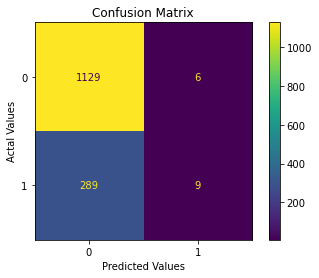

In [35]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(decision_tree, X_test, y_test)
plt.title('Confusion Matrix')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()

In [36]:
#decision tree for top 40%
from sklearn import tree
X = anotherdata.drop('ranking',axis=1).drop('istop20-40%',axis=1).drop('istop20%',axis=1).drop('istop40-60%',axis=1).drop('istop60-80%',axis=1)

y= (anotherdata[['istop20-40%']])
clf4 = tree.DecisionTreeClassifier()
clf40 = clf4.fit(X, y)

In [37]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.33, random_state=42)

[Text(0.5267857142857143, 0.9, 'X[1] <= 136.5\ngini = 0.327\nsamples = 2909\nvalue = [2310, 599]'),
 Text(0.2857142857142857, 0.7, 'X[7] <= 9.89\ngini = 0.374\nsamples = 1622\nvalue = [1218, 404]'),
 Text(0.14285714285714285, 0.5, 'X[1] <= 74.5\ngini = 0.256\nsamples = 418\nvalue = [355, 63]'),
 Text(0.07142857142857142, 0.3, 'X[1] <= 27.5\ngini = 0.336\nsamples = 159\nvalue = [125, 34]'),
 Text(0.03571428571428571, 0.1, 'gini = 0.5\nsamples = 8\nvalue = [4, 4]'),
 Text(0.10714285714285714, 0.1, 'gini = 0.318\nsamples = 151\nvalue = [121, 30]'),
 Text(0.21428571428571427, 0.3, 'X[10] <= 1.96\ngini = 0.199\nsamples = 259\nvalue = [230, 29]'),
 Text(0.17857142857142858, 0.1, 'gini = 0.232\nsamples = 217\nvalue = [188, 29]'),
 Text(0.25, 0.1, 'gini = 0.0\nsamples = 42\nvalue = [42, 0]'),
 Text(0.42857142857142855, 0.5, 'X[1] <= 36.5\ngini = 0.406\nsamples = 1204\nvalue = [863, 341]'),
 Text(0.35714285714285715, 0.3, 'X[2] <= 0.5\ngini = 0.5\nsamples = 47\nvalue = [23, 24]'),
 Text(0.32142

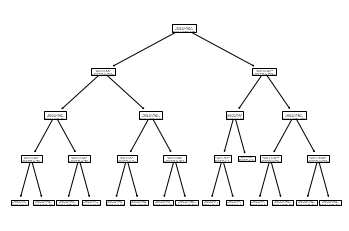

In [38]:
tree.plot_tree(decision_tree)

In [39]:
import matplotlib.pyplot as plt
plt.savefig('tree.eps',format='eps',bbox_inches = "tight")

<Figure size 432x288 with 0 Axes>

In [40]:
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (100,100), dpi=350)
tree.plot_tree(decision_tree,filled=True,rounded=True, ax=axes)


[Text(0.5267857142857143, 0.9, 'X[1] <= 136.5\ngini = 0.327\nsamples = 2909\nvalue = [2310, 599]'),
 Text(0.2857142857142857, 0.7, 'X[7] <= 9.89\ngini = 0.374\nsamples = 1622\nvalue = [1218, 404]'),
 Text(0.14285714285714285, 0.5, 'X[1] <= 74.5\ngini = 0.256\nsamples = 418\nvalue = [355, 63]'),
 Text(0.07142857142857142, 0.3, 'X[1] <= 27.5\ngini = 0.336\nsamples = 159\nvalue = [125, 34]'),
 Text(0.03571428571428571, 0.1, 'gini = 0.5\nsamples = 8\nvalue = [4, 4]'),
 Text(0.10714285714285714, 0.1, 'gini = 0.318\nsamples = 151\nvalue = [121, 30]'),
 Text(0.21428571428571427, 0.3, 'X[10] <= 1.96\ngini = 0.199\nsamples = 259\nvalue = [230, 29]'),
 Text(0.17857142857142858, 0.1, 'gini = 0.232\nsamples = 217\nvalue = [188, 29]'),
 Text(0.25, 0.1, 'gini = 0.0\nsamples = 42\nvalue = [42, 0]'),
 Text(0.42857142857142855, 0.5, 'X[1] <= 36.5\ngini = 0.406\nsamples = 1204\nvalue = [863, 341]'),
 Text(0.35714285714285715, 0.3, 'X[2] <= 0.5\ngini = 0.5\nsamples = 47\nvalue = [23, 24]'),
 Text(0.32142

C:\Users\Public\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


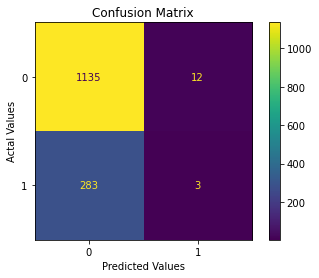

In [41]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(decision_tree, X_test, y_test)
plt.title('Confusion Matrix')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()

In [42]:
#decision tree for top 40-60%
from sklearn import tree
X = anotherdata.drop('ranking',axis=1).drop('istop20-40%',axis=1).drop('istop20%',axis=1).drop('istop40-60%',axis=1).drop('istop60-80%',axis=1)

y= (anotherdata[['istop40-60%']])
clf6 = tree.DecisionTreeClassifier()
clf60 = clf6.fit(X, y)

C:\Users\Public\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


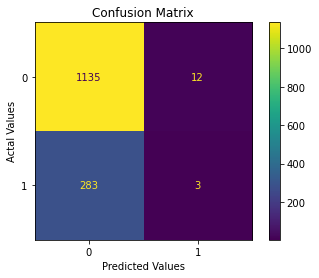

In [43]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(decision_tree, X_test, y_test)
plt.title('Confusion Matrix')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()

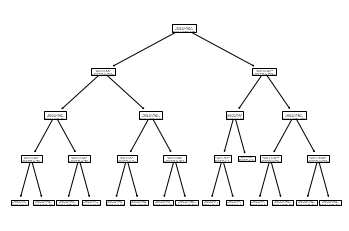

In [44]:
#decision tree for top 60-80%
from sklearn import tree
X = anotherdata.drop('ranking',axis=1).drop('istop20-40%',axis=1).drop('istop20%',axis=1).drop('istop40-60%',axis=1).drop('istop60-80%',axis=1)

y= (anotherdata[['istop60-80%']])
clf8 = tree.DecisionTreeClassifier()
clf80 = clf8.fit(X, y)
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.33, random_state=42)
tree.plot_tree(decision_tree)
import matplotlib.pyplot as plt
plt.savefig('tree.eps',format='eps',bbox_inches = "tight")


C:\Users\Public\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


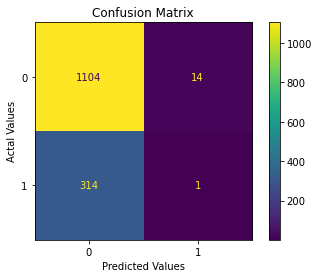

In [45]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(decision_tree, X_test, y_test)
plt.title('Confusion Matrix')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()

In [46]:
from tkinter import *
from tkinter import ttk
import time

In [47]:
class model:
    def __init__(self):
        self.url = ""
        self.file_name = ""
        self.GUI()
    def GUI(self):
        COLOUR_ONE = "#FFFFFF"#white
        COLOUR_TWO = "#FF5A5F"#purple
        COLOUR_THREE = "#000000"#black
        COLOUR_FOUR = "#00A669"

        self.root = Tk()
        self.root.resizable(False, True)
        self.root.title("Airbnb GUI")
        self.root.geometry("650x700")
        self.root.iconbitmap('Airbnb.ico')
        self.root.configure(bg=COLOUR_ONE)
        Label(text="Insert your scores for your Airbnb", font="Helvetica 14 bold",fg=COLOUR_THREE,bg=COLOUR_ONE).pack(padx=15,pady=10,side=TOP,expand=0,fill=BOTH)

        
        #input cases
        superhost = Frame(self.root,bg=COLOUR_ONE)
        superhost.pack(side=TOP,ipadx=20,ipady=10,fill="x")
        Label(superhost,text="Super host?(0/1)", font="Helvetica 11 italic",fg=COLOUR_THREE,bg=COLOUR_ONE).pack(side=LEFT,padx=(70,10),expand=0,fill=BOTH)
        url_superhost = StringVar()
        entry_box_superhost = Entry(superhost,fg=COLOUR_ONE,bg=COLOUR_TWO,justify = CENTER,textvariable=url_superhost)
        entry_box_superhost.pack(side=RIGHT,padx=20,ipadx = 50, ipady = 5)
        entry_box_superhost.focus_force()
        
        price = Frame(self.root,bg=COLOUR_ONE)
        price.pack(side=TOP,ipadx=20,ipady=10,fill="x")
        Label(price,text="Housing price?", font="Helvetica 11 italic",fg=COLOUR_THREE,bg=COLOUR_ONE).pack(side=LEFT,padx=(70,10),expand=0,fill=BOTH)
        url_price = StringVar()
        entry_box_price = Entry(price,fg=COLOUR_ONE,bg=COLOUR_TWO,justify = CENTER,textvariable= url_price)
        entry_box_price.pack(side=RIGHT,padx=20,ipadx = 50, ipady = 5)
  
        locationexact = Frame(self.root,bg=COLOUR_ONE)
        locationexact.pack(side=TOP,ipadx=20,ipady=10,fill="x")
        Label(locationexact,text="Is location exact?(0/1)", font="Helvetica 11 italic",fg=COLOUR_THREE,bg=COLOUR_ONE).pack(side=LEFT,padx=(70,10),expand=0,fill=BOTH)
        url_locationexact = StringVar()
        entry_box_locationexact = Entry(locationexact,fg=COLOUR_ONE,bg=COLOUR_TWO,justify = CENTER,textvariable=url_locationexact)
        entry_box_locationexact.pack(side=RIGHT,padx=20,ipadx = 50, ipady = 5)
           
        avgreviewscore = Frame(self.root,bg=COLOUR_ONE)
        avgreviewscore.pack(side=TOP,ipadx=20,ipady=10,fill="x")
        Label(avgreviewscore,text="Average of review scores?", font="Helvetica 11 italic",fg=COLOUR_THREE,bg=COLOUR_ONE).pack(side=LEFT,padx=(70,10),expand=0,fill=BOTH)
        url_avgreviewscore = StringVar()
        entry_box_avgreviewscore = Entry(avgreviewscore,fg=COLOUR_ONE,bg=COLOUR_TWO,justify = CENTER,textvariable=avgreviewscore)
        entry_box_avgreviewscore.pack(side=RIGHT,padx=20,ipadx = 50, ipady = 5)
        
        propaccuracy = Frame(self.root,bg=COLOUR_ONE)
        propaccuracy.pack(side=TOP,ipadx=20,ipady=10,fill="x")
        Label(propaccuracy,text="Average scores for accuracy?", font="Helvetica 11 italic",fg=COLOUR_THREE,bg=COLOUR_ONE).pack(side=LEFT,padx=(70,10),expand=0,fill=BOTH)
        url_propaccuracy = StringVar()
        entry_box_propaccuracy = Entry(propaccuracy,fg=COLOUR_ONE,bg=COLOUR_TWO,justify = CENTER,textvariable=url_propaccuracy)
        entry_box_propaccuracy.pack(side=RIGHT,padx=20,ipadx = 50, ipady = 5)
        
        avgclean = Frame(self.root,bg=COLOUR_ONE)
        avgclean.pack(side=TOP,ipadx=20,ipady=10,fill="x")
        Label(avgclean,text="Average scores for cleanliness?", font="Helvetica 11 italic",fg=COLOUR_THREE,bg=COLOUR_ONE).pack(side=LEFT,padx=(70,10),expand=0,fill=BOTH)
        url_avgclean = StringVar()
        entry_box_avgclean = Entry(avgclean,fg=COLOUR_ONE,bg=COLOUR_TWO,justify = CENTER,textvariable=url_avgclean)
        entry_box_avgclean.pack(side=RIGHT,padx=20,ipadx = 50, ipady = 5)
        
        
        avgquick = Frame(self.root,bg=COLOUR_ONE)
        avgquick.pack(side=TOP,ipadx=20,ipady=10,fill="x")
        Label(avgquick,text="Average scores for check-in?", font="Helvetica 11 italic",fg=COLOUR_THREE,bg=COLOUR_ONE).pack(side=LEFT,padx=(70,10),expand=0,fill=BOTH)
        url_avgquick = StringVar()
        entry_box_avgquick = Entry(avgquick,fg=COLOUR_ONE,bg=COLOUR_TWO,justify = CENTER,textvariable=url_avgquick)
        entry_box_avgquick.pack(side=RIGHT,padx=20,ipadx = 50, ipady = 5)
       
        avgcomn = Frame(self.root,bg=COLOUR_ONE)
        avgcomn.pack(side=TOP,ipadx=20,ipady=10,fill="x")
        Label(avgcomn,text="Average scores for convenience?", font="Helvetica 11 italic",fg=COLOUR_THREE,bg=COLOUR_ONE).pack(side=LEFT,padx=(70,10),expand=0,fill=BOTH)
        url_avgcomn = StringVar()
        entry_box_avgcomn = Entry(avgcomn,fg=COLOUR_ONE,bg=COLOUR_TWO,justify = CENTER,textvariable= url_avgcomn)
        entry_box_avgcomn.pack(side=RIGHT,padx=20,ipadx = 50, ipady = 5)
        
        avgcp = Frame(self.root,bg=COLOUR_ONE)
        avgcp.pack(side=TOP,ipadx=20,ipady=10,fill="x")
        Label(avgcp,text="Average scores for CP value?", font="Helvetica 11 italic",fg=COLOUR_THREE,bg=COLOUR_ONE).pack(side=LEFT,padx=(70,10),expand=0,fill=BOTH)
        url_avgcp = StringVar()
        entry_box_avgcp = Entry(avgcp,fg=COLOUR_ONE,bg=COLOUR_TWO,justify = CENTER,textvariable=url_avgcp)
        entry_box_avgcp.pack(side=RIGHT,padx=20,ipadx = 50, ipady = 5)
        
        avgcommu = Frame(self.root,bg=COLOUR_ONE)
        avgcommu.pack(side=TOP,ipadx=20,ipady=10,fill="x")
        Label( avgcommu,text="Average scores for communication?", font="Helvetica 11 italic",fg=COLOUR_THREE,bg=COLOUR_ONE).pack(side=LEFT,padx=(70,10),expand=0,fill=BOTH)
        url_avgcommu = StringVar()
        entry_box_avgcommu = Entry( avgcommu,fg=COLOUR_ONE,bg=COLOUR_TWO,justify = CENTER,textvariable=url_avgcommu )
        entry_box_avgcommu.pack(side=RIGHT,padx=20,ipadx = 50, ipady = 5)
       
        
        numview = Frame(self.root,bg=COLOUR_ONE)
        numview.pack(side=TOP,ipadx=20,ipady=10,fill="x")
        Label(numview,text="Number of review last month?", font="Helvetica 11 italic",fg=COLOUR_THREE,bg=COLOUR_ONE).pack(side=LEFT,padx=(70,10),expand=0,fill=BOTH)
        url_numview = StringVar()
        entry_box_numview = Entry(numview,fg=COLOUR_ONE,bg=COLOUR_TWO,justify = CENTER,textvariable=url_numview)
        entry_box_numview.pack(side=RIGHT,padx=20,ipadx = 50, ipady = 5)
        
        def calculating(matrix):
            result = [clf20.predict(matrix),clf40.predict(matrix)
                      ,clf60.predict(matrix),clf80.predict(matrix)]
            for i in range(0,len(result)):
                if((result[i] == 1) == True):
                    if(i==0):
                        self.root.after(3000,self.text.insert(END,"\nCongrates! Your property is ranked top 20%!"))
                    elif(i==1):
                        self.root.after(3000,self.text.insert(END,"\nCongrates! Your property is ranked top 20-40%!"))
                    elif(i==2):
                        self.root.after(3000,self.text.insert(END,"\nEn... Your property is ranked top 40-60%!"))
                    elif(i==3):
                        self.root.after(3000,self.text.insert(END,"\nEn... Your property is ranked top 60-80%...you might need some work..."))
                    else:
                        self.root.after(3000,self.text.insert(END,"\nEn... You really need some work...Your property is not even in top 80%!"))

        frame_two = Frame(self.root,bg=COLOUR_ONE)
        frame_two.pack(side=TOP,ipadx=50,ipady=10,fill="x")
        def save():
            self.superhost = float(entry_box_superhost.get())
            self.price =  float(entry_box_price.get())
            self.locationexact =  float(entry_box_locationexact.get())
            self.avgreviewscore =  float(entry_box_avgreviewscore.get())
            self.propaccuracy =  float(entry_box_propaccuracy.get())
            self.avgclean = float(entry_box_avgclean.get())
            self.avgquick = float(entry_box_avgquick.get())
            self.avgcomn = float(entry_box_avgcomn.get())
            self.avgcp = float(entry_box_avgcp.get())
            self.avgcommu = float(entry_box_avgcommu.get())
            self.numview = float(entry_box_numview.get())
            calculating([[self.superhost,self.price,self.locationexact,
                         self.avgreviewscore ,self.propaccuracy,
                          self.avgclean,self.avgquick,self.avgcomn,
                          self.avgcp,self.avgcommu,self.numview]])
            self.text.see("end")
        self.text = Text(frame_two, font="Helvetica 9 italic",bg=COLOUR_ONE,fg=COLOUR_THREE)
        run_script = Button(frame_two,text="Run Script",font="Helvetica 11 italic",fg=COLOUR_ONE,
                            bg=COLOUR_THREE, command=save)
        run_script.pack(side=BOTTOM,pady=20,ipady=2,ipadx=10)
        self.text.pack(side=TOP,ipady=50, ipadx=90,padx=50,pady=(20,0))
        self.text.insert(END,"Enter scores in the box, click the button below, rankings will be shown here.")
        self.text.see("end")
        #self.Refresh_Gui()
        self.root.mainloop()

    def Refresh_Gui(self):
        self.root.update_idletasks()
        self.root.update()
            
if __name__ == "__main__":
    model()

In [48]:
anotherdata[['review_scores_rating','review_scores_accuracy',
         'review_scores_accuracy','review_scores_cleanliness'
         ,'review_scores_checkin','review_scores_communication'
         ,'review_scores_location','review_scores_value','istop20%']].groupby('istop20%').describe()

review_scores_rating                                               \
                        count       mean       std   min   25%   50%   75%   
istop20%                                                                     
0                      3445.0  93.949501  6.754667  20.0  93.0  95.0  98.0   
1                       897.0  95.098884  5.529362  20.0  94.0  96.0  98.0   

                review_scores_accuracy            ... review_scores_location  \
            max                  count      mean  ...                    75%   
istop20%                                          ...                          
0         100.0                 3445.0  9.596293  ...                   10.0   
1         100.0                  897.0  9.720556  ...                   10.0   

               review_scores_value                                          \
           max               count      mean       std  min  25%       50%   
istop20%                                                                     
0         10.0              3445.0  9.370650  0.752640  2.0  9.0   9.40181   
1         10.0               897.0  9.520816  0.607824  6.0  9.0  10.00000   

                      
           75%   max  
istop20%              
0         10.0  10.0  
1         10.0  10.0  

[2 rows x 64 columns]

In [49]:
anotherdata[['review_scores_rating','review_scores_accuracy',
         'review_scores_accuracy','review_scores_cleanliness'
         ,'review_scores_checkin','review_scores_communication'
         ,'review_scores_location','review_scores_value','istop20-40%']].groupby('istop20-40%').describe()

review_scores_rating                                               \
                           count       mean       std   min   25%   50%   75%   
istop20-40%                                                                     
0                         3445.0  94.191016  6.502557  20.0  93.0  95.0  98.0   
1                          897.0  94.171325  6.668563  20.0  93.0  95.0  98.0   

                   review_scores_accuracy            ...  \
               max                  count      mean  ...   
istop20-40%                                          ...   
0            100.0                 3445.0  9.619705  ...   
1            100.0                  897.0  9.630642  ...   

            review_scores_location       review_scores_value            \
                               75%   max               count      mean   
istop20-40%                                                              
0                             10.0  10.0              3445.0  9.398024   
1                             10.0  10.0               897.0  9.415685   

                                                      
                  std  min  25%      50%   75%   max  
istop20-40%                                           
0            0.720068  2.0  9.0  9.40181  10.0  10.0  
1            0.755973  2.0  9.0  9.40181  10.0  10.0  

[2 rows x 64 columns]

In [50]:
anotherdata[['review_scores_rating','review_scores_accuracy',
         'review_scores_accuracy','review_scores_cleanliness'
         ,'review_scores_checkin','review_scores_communication'
         ,'review_scores_location','review_scores_value','istop40-60%']].groupby('istop40-60%').describe()

review_scores_rating                                          \
                           count       mean       std   min    25%   50%   
istop40-60%                                                                
0                         3446.0  94.315856  6.397048  20.0  93.00  95.0   
1                          896.0  93.691171  7.028602  58.0  92.75  95.0   

                         review_scores_accuracy            ...  \
              75%    max                  count      mean  ...   
istop40-60%                                                ...   
0            98.0  100.0                 3446.0  9.632061  ...   
1            98.0  100.0                  896.0  9.583135  ...   

            review_scores_location       review_scores_value            \
                               75%   max               count      mean   
istop40-60%                                                              
0                             10.0  10.0              3446.0  9.417302   
1                             10.0  10.0               896.0  9.341561   

                                                      
                  std  min  25%      50%   75%   max  
istop40-60%                                           
0            0.709899  2.0  9.0  9.40181  10.0  10.0  
1            0.789442  4.0  9.0  9.40181  10.0  10.0  

[2 rows x 64 columns]

In [51]:
anotherdata[['review_scores_rating','review_scores_accuracy',
         'review_scores_accuracy','review_scores_cleanliness'
         ,'review_scores_checkin','review_scores_communication'
         ,'review_scores_location','review_scores_value','istop60-80%']].groupby('istop60-80%').describe()

review_scores_rating                                               \
                           count       mean       std   min   25%   50%   75%   
istop60-80%                                                                     
0                         3445.0  94.100624  6.612120  20.0  93.0  95.0  98.0   
1                          897.0  94.518484  6.229635  40.0  94.0  95.0  99.0   

                   review_scores_accuracy            ...  \
               max                  count      mean  ...   
istop60-80%                                          ...   
0            100.0                 3445.0  9.615378  ...   
1            100.0                  897.0  9.647259  ...   

            review_scores_location       review_scores_value            \
                               75%   max               count      mean   
istop60-80%                                                              
0                             10.0  10.0              3445.0  9.389937   
1                             10.0  10.0               897.0  9.446742   

                                                      
                  std  min  25%      50%   75%   max  
istop60-80%                                           
0            0.734003  2.0  9.0  9.40181  10.0  10.0  
1            0.700925  4.0  9.0  9.40181  10.0  10.0  

[2 rows x 64 columns]